# Comparing Atmospheric Model Output with Observations Using Intake-ESM

Comparing models and observations is a critical component of climate diagnostic packages. This process can be challenging though - given the number of observational datasets to compare against, and the difference in spatiotemporal resolutions. In the previous iteration of the diagnostics package used for atmospheric data from the Community Earth System Model (CESM), they used pre-computed, observational datasets stored in a directory on the GLADE filesystem (`/glade/p/cesm/amwg/amwg_diagnostics/obs_data`)

Within this example, we walk though generating an `intake-esm` catalog from the observational data, reading in CESM data, and compare models and observations

## Imports

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
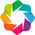

In [2]:
import ast
from datetime import datetime
import glob
import pathlib
import traceback
import warnings

import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from ncar_jobqueue import NCARCluster
from distributed import Client
import geocat.comp
import hvplot
import hvplot.xarray
import holoviews as hv
import geoviews.feature as gf
import cartopy.crs as ccrs

import intake
from ecgtools import Builder
from ecgtools.builder import INVALID_ASSET, TRACEBACK

hv.extension('bokeh')

## Build an `Intake-ESM` catalog from the observational dataset
Before we jump into building the catalog, let's take a look at what data we are working with

### Investigate the File Structure and Sample Dataset

In [3]:
files = sorted(glob.glob('/glade/p/cesm/amwg/amwg_diagnostics/obs_data/*'))
files[::20]

['/glade/p/cesm/amwg/amwg_diagnostics/obs_data/AIRS_01_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/ARM_annual_cycle_twp_c2_cmbe_sound_p_f.cdf',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/CERES-EBAF_01_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/CERES2_04_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/CERES_07_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/CLOUDSATCOSP_07_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/CLOUDSAT_10_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/ECMWF_09_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/EP.ERAI_DJF_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/ERAI_04_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/ERBE_07_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/ERS_12_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/GPCP_JJA_climo.nc',
 '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/HadISST_CL_03_climo.nc',
 '/glade/p/cesm/am

Observational datasetsets in this directory follow the convention `source_(month or season)_climo.nc`.

Let's open up one of those datasets

In [4]:
ds = xr.open_dataset('/glade/p/cesm/amwg/amwg_diagnostics/obs_data/CERES-EBAF_01_climo.nc')
ds

<xarray.Dataset>
Dimensions:  (lon: 360, lat: 180, time: 1)
Coordinates:
  * lon      (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * lat      (lat) float32 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * time     (time) float32 1.0
Data variables:
    SOLIN    (time, lat, lon) float32 ...
    FLUT     (time, lat, lon) float32 ...
    FLUTC    (time, lat, lon) float32 ...
    FSNTOA   (time, lat, lon) float32 ...
    FSNTOAC  (time, lat, lon) float32 ...
    SWCF     (time, lat, lon) float32 ...
    LWCF     (time, lat, lon) float32 ...
    RESTOA   (time, lat, lon) float32 ...
    ALBEDO   (time, lat, lon) float32 ...
    ALBEDOC  (time, lat, lon) float32 ...
    gw       (lat) float64 ...
Attributes:
    version:             This is version 2.8: March 7, 2014
    institution:         NASA Langley Research Center
    comment:             Data is from East to West and South to North. Climat...
    title:               CERES EBAF (Energy Balanced and Filled) Fluxes. Mont...
    AMWG_author:         Cecile Hannay
    AMWG_creation_date:  Thu Jul 24 16:08:10 MDT 2014 for AMWG package
    history:             Thu Jul 24 16:08:10 2014: ncks -A -v gw CERES2_01_cl...
    NCO:                 20140724

We see that this dataset is gridded on a global 0.5&deg; grid, with several variables related to solar fluxes (ex. `TOA net shortwave`)

### Build a parser using `ecgtools`

We can use the [`ecgtools`](https://ecgtools.readthedocs.io/en/latest/) package to help build an `intake-esm` catalog for this dataset!

We start first by using [`pathlib`](https://docs.python.org/3/library/pathlib.html) to generically look at the filepaths

In [5]:
path = pathlib.Path(files[0])
path.stem

'AIRS_01_climo'

This path can be split using `.split('_')`, separates the path into the following:
* observational dataset source
* month number or season
* "climo"

In [6]:
path.stem.split('_')

['AIRS', '01', 'climo']

We can also gather useful insight by opening the file!

In [7]:
ds = xr.open_dataset(files[0])

Let's look at the variable "Temperature" (`T`)

In [8]:
ds.T

<xarray.DataArray 'T' (time: 1, lev: 13, lat: 94, lon: 192)>
[234624 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -88.54 -86.65 -84.75 -82.85 ... 84.75 86.65 88.54
  * time     (time) int32 1
  * lev      (lev) float32 1e+03 925.0 850.0 700.0 ... 200.0 150.0 100.0 70.0
  * lon      (lon) float32 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
Attributes:
    units:        K
    long_name:    Temperature
    climatology:  AIRS monthly climatology 9/2002-8/2006

You'll notice that we have additional attributes about the dataset which we can use, including:
* units
* long_name
* climatology, which includes more information about what dates were used

#### Adding the parsing function

In [9]:
def parse_amwg_obs(file):
    """Atmospheric observational data used within the AMWG diagnostic package
    
    Parameters
    ----------
    file: str
      filepath from the data directory including observational climatologies
    
    Returns
    -------
    info: dict
       Dictionary with information to add as columns in the data catalog
    
    """
    file = pathlib.Path(file)
    info_list = []
    info = {}

    try:
        stem = file.stem
        split = stem.split('_')
        info['source'] = split[0]
        temporal = split[-2]
        if len(split[-2]) == 2:
            month_number = int(temporal)
            info['time_period'] = 'monthly'
            info['temporal'] = datetime(2020, month_number, 1).strftime('%b').upper()
            
        elif len(temporal) == 3:
            info['time_period'] = 'seasonal'
            info['temporal'] = temporal
            
        else:
            info['time_period'] = np.nan
            info['temporal'] = np.nan
        
        with xr.open_dataset(file, chunks={}, decode_times=False) as ds:
            variables = [
                v
                for v, da in ds.variables.items()
                if 'time' in da.dims
            ]
            info['variables'] = variables 
            
            
            info['path'] = str(path)

            
        return info

    except Exception:
        return {INVALID_ASSET: file, TRACEBACK: traceback.format_exc()}

In [10]:
'time' in ds['T'].dims

True

In [11]:
info = parse_amwg_obs(files[0])
info

{'source': 'AIRS',
 'time_period': 'monthly',
 'temporal': 'JAN',
 'variables': ['T', 'time', 'RELHUM', 'O3', 'SHUM'],
 'path': '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/AIRS_01_climo.nc'}

In [12]:
pd.DataFrame(info)

,source,time_period,temporal,variables,path
0,AIRS,monthly,JAN,T,/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
1,AIRS,monthly,JAN,time,/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
2,AIRS,monthly,JAN,RELHUM,/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
3,AIRS,monthly,JAN,O3,/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
4,AIRS,monthly,JAN,SHUM,/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...


We can test this on a single file!

This dictionary can easily be converted into a `pandas.Dataframe`

In [13]:
pd.DataFrame([info, info])

,source,time_period,temporal,variables,path
0,AIRS,monthly,JAN,"[T, time, RELHUM, O3, SHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
1,AIRS,monthly,JAN,"[T, time, RELHUM, O3, SHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...


### Use `ecgtools` to build the catalog
Now that we have our parser ready to go, we can use `ecgtools` to build the catalog

In [14]:
b = Builder(
    # Directory with the output
    f"/glade/p/cesm/amwg/amwg_diagnostics/obs_data/",
    depth=3, 
    # Number of jobs to execute - should be equal to # threads you are using
    njobs=-1,
)

Once we set up the builder, can call `.build`, passing in the parser we built

In [ ]:
b.build(parse_amwg_obs)

In [16]:
b.df

,source,time_period,temporal,variables,path
0,AIRS,monthly,JAN,"[T, time, RELHUM, O3, SHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
1,AIRS,monthly,FEB,"[T, time, RELHUM, O3, SHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
2,AIRS,monthly,MAR,"[T, time, RELHUM, O3, SHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
3,AIRS,monthly,APR,"[T, time, RELHUM, O3, SHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
4,AIRS,monthly,MAY,"[T, time, RELHUM, O3, SHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
...,...,...,...,...,...
3778,mlsw,seasonal,ANN,"[T, time, Z3, H2O, O3, RELHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
3779,mlsw,seasonal,DJF,"[T, time, Z3, H2O, O3, RELHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
3780,mlsw,seasonal,JJA,"[T, time, Z3, H2O, O3, RELHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...
3781,mlsw,seasonal,MAM,"[T, time, Z3, H2O, O3, RELHUM]",/glade/p/cesm/amwg/amwg_diagnostics/obs_data/A...


### Save the catalog

In [17]:
b.save(
    # File path - could save as .csv (uncompressed csv) or .csv.gz (compressed csv)
    "/glade/work/mgrover/intake-esm-catalogs/amwg_obs_datasets.csv",
    # Column name including filepath
    path_column_name='path',
    # Column name including variables
    variable_column_name='variables',
    # Data file format - could be netcdf or zarr (in this case, netcdf)
    data_format="netcdf",
    # Which attributes to groupby when reading in variables using intake-esm
    groupby_attrs=["source", "time_period"],
    # Aggregations which are fed into xarray when reading in data using intake
    aggregations=[
        {
            'type': 'join_new',
            'attribute_name': 'temporal',
            'options': {'coords': 'minimal', 'compat': 'override'},
        },
    ],
)

Saved catalog location: /glade/work/mgrover/intake-esm-catalogs/amwg_obs_datasets.json and /glade/work/mgrover/intake-esm-catalogs/amwg_obs_datasets.csv


/glade/scratch/mgrover/ipykernel_140729/3449059562.py:1: UserWarning: Unable to parse 2541 assets/files. A list of these assets can be found in /glade/work/mgrover/intake-esm-catalogs/invalid_assets_amwg_obs_datasets.csv.
  b.save(


## Read in Observational Data from the Catalog

We use `intake-esm` to read in the observational data from the catalog we just created

In [18]:
obs_catalog = intake.open_esm_datastore(
    "/glade/work/mgrover/intake-esm-catalogs/amwg_obs_datasets.json",
    csv_kwargs={"converters": {"variables": ast.literal_eval}},
    sep="/",
)

We are interested in Temperature (`T`), from the `AIRS` dataset, [which comes from NASA](https://airs.jpl.nasa.gov/data/get-data/obs4mips/)

In [19]:
obs_catalog_subset = obs_catalog.search(variables='T', source='AIRS')

In [24]:
dsets = obs_catalog_subset.to_dataset_dict()


--> The keys in the returned dictionary of datasets are constructed as follows:
	'source/time_period'


Our dictionary of datasets has two keys, one for seasonal and the other for monthly climatologies

In [25]:
dsets.keys()

dict_keys(['AIRS/seasonal', 'AIRS/monthly'])

In [26]:
seasonal_obs_ds = dsets['AIRS/seasonal']
monthly_obs_ds = dsets['AIRS/monthly']

## Plot Observational Temperature Climatologies
Now that we read in our data, we can plot up our results!

### Plot Seasonal Temperature Climatologies from Observations

In [21]:
seasonal_obs_plot = seasonal_obs_ds.isel(time=0, lev=range(3)).T.hvplot.quadmesh(rasterize=True, groupby=['lev', 'temporal'], 
                                                                          cmap='magma', projection=ccrs.Robinson()) * gf.coastline
seasonal_obs_plot

:DynamicMap   [lev,temporal]
   :Overlay
      .Image.I     :Image   [lon,lat]   (T)
      .Coastline.I :Feature   [Longitude,Latitude]

### Plot Monthly Temperature Climatologies from Observations

In [22]:
monthly_obs_plot = monthly_obs_ds.isel(time=0, lev=range(3)).T.hvplot.quadmesh(rasterize=True, groupby=['lev', 'temporal'], 
                                                                               cmap='magma', projection=ccrs.Robinson()) * gf.coastline
monthly_obs_plot

:DynamicMap   [lev,temporal]
   :Overlay
      .Image.I     :Image   [lon,lat]   (T)
      .Coastline.I :Feature   [Longitude,Latitude]

## Read in CESM Output

In [22]:
cesm_data_catalog = intake.open_esm_datastore('/glade/collections/cmip/catalog/intake-esm-datastore/catalogs/glade-cesm2-le.json')

/glade/work/mgrover/miniconda3/envs/cesm-collections-dev/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (8,9) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
cluster = NCARCluster(memory='10 GB')
cluster.scale(20)
client = Client(cluster)

In [50]:
client

<Client: 'tcp://10.12.206.54:39511' processes=20 threads=40, memory=186.20 GiB>

### Query for monthly temperature (`T`) values, using the historical experiment

In [51]:
cesm_data_catalog_subset = cesm_data_catalog.search(variable='T', control_branch_year=1001,
                                                    frequency='month_1', experiment='historical')

Since we taking the average over time, we choose to chunk by vertical levels (`lev`)

In [52]:
dsets = cesm_data_catalog_subset.to_dataset_dict(cdf_kwargs={'chunks':{'lev':5}})


--> The keys in the returned dictionary of datasets are constructed as follows:
	'component.experiment.stream.forcing_variant.control_branch_year.variable'


We only have a single key - with the `component.experiment.stream.forcing_variant.control_branch_year.variable`

In [53]:
ds = dsets['atm.historical.cam.h0.cmip6.1001.T']

Our dataset has a chunk size of ~125 mb which is around the optimal size!

In [54]:
ds.T

<xarray.DataArray 'T' (member_id: 1, time: 1980, lev: 32, lat: 192, lon: 288)>
dask.array<broadcast_to, shape=(1, 1980, 32, 192, 288), dtype=float32, chunksize=(1, 120, 5, 192, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lev        (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * time       (time) object 1860-02-01 00:00:00 ... 1980-01-01 00:00:00
  * member_id  (member_id) <U11 'r1i1001p1f1'
Attributes:
    mdims:         1
    units:         K
    long_name:     Temperature
    cell_methods:  time: mean

### Compute Monthly and Seasonal Averages
Over the summer, 

In [115]:
cesm_monthly_mean_temperature = geocat.comp.climatology(ds.T, 'month')
cesm_seasonal_mean_temperature = geocat.comp.climatology(ds.T, 'season')

In [116]:
cesm_monthly_mean_temperature.load()
cesm_seasonal_mean_temperature.load()

<xarray.DataArray 'T' (member_id: 1, season: 4, lev: 32, lat: 192, lon: 288)>
array([[[[[271.27997, 271.27997, 271.27997, ..., 271.27997, 271.27997,
           271.27997],
          [271.22708, 271.22745, 271.22787, ..., 271.226  , 271.22632,
           271.2267 ],
          [271.1701 , 271.1706 , 271.1711 , ..., 271.16895, 271.16928,
           271.1697 ],
          ...,
          [204.17365, 204.15831, 204.14384, ..., 204.22487, 204.20694,
           204.18985],
          [204.95549, 204.9503 , 204.94557, ..., 204.97383, 204.96724,
           204.96115],
          [206.02718, 206.02718, 206.02718, ..., 206.02718, 206.02718,
           206.02718]],

         [[255.13527, 255.13527, 255.13527, ..., 255.13527, 255.13527,
           255.13527],
          [255.05142, 255.05226, 255.05318, ..., 255.0489 , 255.04971,
           255.05055],
          [254.94571, 254.94685, 254.94814, ..., 254.94264, 254.94356,
           254.9446 ],
...
          [265.77487, 265.7838 , 265.7927 , ..., 265.747  , 265.75638,
           265.76566],
          [265.74924, 265.7531 , 265.757  , ..., 265.7369 , 265.7411 ,
           265.7452 ],
          [265.73276, 265.73276, 265.73276, ..., 265.7328 , 265.73276,
           265.73276]],

         [[217.79984, 217.79984, 217.79984, ..., 217.79984, 217.79984,
           217.79984],
          [218.30846, 218.30481, 218.30156, ..., 218.32202, 218.31757,
           218.3122 ],
          [218.94579, 218.91786, 218.88835, ..., 219.02962, 219.     ,
           218.97177],
          ...,
          [265.71143, 265.72287, 265.73416, ..., 265.67624, 265.6879 ,
           265.69962],
          [265.69626, 265.701  , 265.70557, ..., 265.68204, 265.68677,
           265.6915 ],
          [265.68402, 265.68405, 265.68408, ..., 265.68396, 265.684  ,
           265.684  ]]]]], dtype=float32)
Coordinates:
  * lat        (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon        (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lev        (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * member_id  (member_id) <U11 'r1i1001p1f1'
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    mdims:         1
    units:         K
    long_name:     Temperature
    cell_methods:  time: mean

## Plot CESM2-LE Temperature Climatologies

### Plot up the Seasonal Mean Temperature
We select for our single `member_id`, and choose the last few vertical levels since the vertical dimensions are sorted from the top of the atmosphere, to the bottom, which is the inverse of how the observational data is sorted

In [121]:
cesm_seasonal_temperature_plot = cesm_seasonal_mean_temperature.isel(member_id=0, lev=range(-5, -1)).T.hvplot.quadmesh(rasterize=True, groupby=['lev', 'season'], x='lon', y='lat',
                                                                  cmap='magma', projection=ccrs.Robinson(), project=True) * gf.coastline
cesm_seasonal_temperature_plot

:DynamicMap   [lev,season]
   :Overlay
      .Image.I     :Image   [lon,lat]   (T)
      .Coastline.I :Feature   [Longitude,Latitude]

### Plot up the Monthly Mean Temperature

In [123]:
cesm_monthly_temperature_plot = cesm_monthly_mean_temperature.isel(member_id=0, lev=range(-5, -1)).T.hvplot.quadmesh(rasterize=True, groupby=['lev', 'month'], x='lon', y='lat',
                                                                  cmap='magma', projection=ccrs.Robinson(), project=True) * gf.coastline
cesm_monthly_temperature_plot

:DynamicMap   [lev,month]
   :Overlay
      .Image.I     :Image   [lon,lat]   (T)
      .Coastline.I :Feature   [Longitude,Latitude]

## Conclusion
Throughout this example, we showed how useful `intake-esm` can be when querying datasets, both **observational** and **model** datasets! We also showed you can use [hvPlot](https://hvplot.holoviz.org/) to plot interactive maps, even transforming to different coordinate reference systems. While the observational and model datasets did not have matching spatial or vertical coordinates, plotting these comparisons as a first cut can still be useful!

If you are interested in using the data catalogs, go for it! Here are the paths:

* AMWG Observational Comparison Catalog - `/glade/work/mgrover/intake-esm-catalogs/amwg_obs_datasets.json`
* CESM2 Large Ensemble Catalog = `/glade/collections/cmip/catalog/intake-esm-datastore/catalogs/glade-cesm2-le.json`